In [1]:

# imports
import os
import sys
import types
import json

# figure size/format
fig_width = 7
fig_height = 5
fig_format = 'retina'
fig_dpi = 96
interactivity = ''
is_shiny = False
is_dashboard = False
plotly_connected = True

# matplotlib defaults / format
try:
  import matplotlib.pyplot as plt
  plt.rcParams['figure.figsize'] = (fig_width, fig_height)
  plt.rcParams['figure.dpi'] = fig_dpi
  plt.rcParams['savefig.dpi'] = fig_dpi
  from IPython.display import set_matplotlib_formats
  set_matplotlib_formats(fig_format)
except Exception:
  pass

# plotly use connected mode
try:
  import plotly.io as pio
  if plotly_connected:
    pio.renderers.default = "notebook_connected"
  else:
    pio.renderers.default = "notebook"
  for template in pio.templates.keys():
    pio.templates[template].layout.margin = dict(t=30,r=0,b=0,l=0)
except Exception:
  pass

# disable itables paging for dashboards
if is_dashboard:
  try:
    from itables import options
    options.dom = 'fiBrtlp'
    options.maxBytes = 1024 * 1024
    options.language = dict(info = "Showing _TOTAL_ entries")
    options.classes = "display nowrap compact"
    options.paging = False
    options.searching = True
    options.ordering = True
    options.info = True
    options.lengthChange = False
    options.autoWidth = False
    options.responsive = True
    options.keys = True
    options.buttons = []
  except Exception:
    pass
  
  try:
    import altair as alt
    # By default, dashboards will have container sized
    # vega visualizations which allows them to flow reasonably
    theme_sentinel = '_quarto-dashboard-internal'
    def make_theme(name):
        nonTheme = alt.themes._plugins[name]    
        def patch_theme(*args, **kwargs):
            existingTheme = nonTheme()
            if 'height' not in existingTheme:
              existingTheme['height'] = 'container'
            if 'width' not in existingTheme:
              existingTheme['width'] = 'container'

            if 'config' not in existingTheme:
              existingTheme['config'] = dict()
            
            # Configure the default font sizes
            title_font_size = 15
            header_font_size = 13
            axis_font_size = 12
            legend_font_size = 12
            mark_font_size = 12
            tooltip = False

            config = existingTheme['config']

            # The Axis
            if 'axis' not in config:
              config['axis'] = dict()
            axis = config['axis']
            if 'labelFontSize' not in axis:
              axis['labelFontSize'] = axis_font_size
            if 'titleFontSize' not in axis:
              axis['titleFontSize'] = axis_font_size  

            # The legend
            if 'legend' not in config:
              config['legend'] = dict()
            legend = config['legend']
            if 'labelFontSize' not in legend:
              legend['labelFontSize'] = legend_font_size
            if 'titleFontSize' not in legend:
              legend['titleFontSize'] = legend_font_size  

            # The header
            if 'header' not in config:
              config['header'] = dict()
            header = config['header']
            if 'labelFontSize' not in header:
              header['labelFontSize'] = header_font_size
            if 'titleFontSize' not in header:
              header['titleFontSize'] = header_font_size    

            # Title
            if 'title' not in config:
              config['title'] = dict()
            title = config['title']
            if 'fontSize' not in title:
              title['fontSize'] = title_font_size

            # Marks
            if 'mark' not in config:
              config['mark'] = dict()
            mark = config['mark']
            if 'fontSize' not in mark:
              mark['fontSize'] = mark_font_size

            # Mark tooltips
            if tooltip and 'tooltip' not in mark:
              mark['tooltip'] = dict(content="encoding")

            return existingTheme
            
        return patch_theme

    # We can only do this once per session
    if theme_sentinel not in alt.themes.names():
      for name in alt.themes.names():
        alt.themes.register(name, make_theme(name))
      
      # register a sentinel theme so we only do this once
      alt.themes.register(theme_sentinel, make_theme('default'))
      alt.themes.enable('default')

  except Exception:
    pass

# enable pandas latex repr when targeting pdfs
try:
  import pandas as pd
  if fig_format == 'pdf':
    pd.set_option('display.latex.repr', True)
except Exception:
  pass

# interactivity
if interactivity:
  from IPython.core.interactiveshell import InteractiveShell
  InteractiveShell.ast_node_interactivity = interactivity

# NOTE: the kernel_deps code is repeated in the cleanup.py file
# (we can't easily share this code b/c of the way it is run).
# If you edit this code also edit the same code in cleanup.py!

# output kernel dependencies
kernel_deps = dict()
for module in list(sys.modules.values()):
  # Some modules play games with sys.modules (e.g. email/__init__.py
  # in the standard library), and occasionally this can cause strange
  # failures in getattr.  Just ignore anything that's not an ordinary
  # module.
  if not isinstance(module, types.ModuleType):
    continue
  path = getattr(module, "__file__", None)
  if not path:
    continue
  if path.endswith(".pyc") or path.endswith(".pyo"):
    path = path[:-1]
  if not os.path.exists(path):
    continue
  kernel_deps[path] = os.stat(path).st_mtime
print(json.dumps(kernel_deps))

# set run_path if requested
if r'/home/quicho/Escritorio/Ciencia-de-datos-con-Python-de-estadísti-a-descriptiva-a-redes-neuronales/statistics':
  os.chdir(r'/home/quicho/Escritorio/Ciencia-de-datos-con-Python-de-estadísti-a-descriptiva-a-redes-neuronales/statistics')

# reset state
%reset

# shiny
# Checking for shiny by using False directly because we're after the %reset. We don't want
# to set a variable that stays in global scope.
if False:
  try:
    import htmltools as _htmltools
    import ast as _ast

    _htmltools.html_dependency_render_mode = "json"

    # This decorator will be added to all function definitions
    def _display_if_has_repr_html(x):
      try:
        # IPython 7.14 preferred import
        from IPython.display import display, HTML
      except:
        from IPython.core.display import display, HTML

      if hasattr(x, '_repr_html_'):
        display(HTML(x._repr_html_()))
      return x

    # ideally we would undo the call to ast_transformers.append
    # at the end of this block whenver an error occurs, we do 
    # this for now as it will only be a problem if the user 
    # switches from shiny to not-shiny mode (and even then likely
    # won't matter)
    import builtins
    builtins._display_if_has_repr_html = _display_if_has_repr_html

    class _FunctionDefReprHtml(_ast.NodeTransformer):
      def visit_FunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

      def visit_AsyncFunctionDef(self, node):
        node.decorator_list.insert(
          0,
          _ast.Name(id="_display_if_has_repr_html", ctx=_ast.Load())
        )
        return node

    ip = get_ipython()
    ip.ast_transformers.append(_FunctionDefReprHtml())

  except:
    pass

def ojs_define(**kwargs):
  import json
  try:
    # IPython 7.14 preferred import
    from IPython.display import display, HTML
  except:
    from IPython.core.display import display, HTML

  # do some minor magic for convenience when handling pandas
  # dataframes
  def convert(v):
    try:
      import pandas as pd
    except ModuleNotFoundError: # don't do the magic when pandas is not available
      return v
    if type(v) == pd.Series:
      v = pd.DataFrame(v)
    if type(v) == pd.DataFrame:
      j = json.loads(v.T.to_json(orient='split'))
      return dict((k,v) for (k,v) in zip(j["index"], j["data"]))
    else:
      return v

  v = dict(contents=list(dict(name=key, value=convert(value)) for (key, value) in kwargs.items()))
  display(HTML('<script type="ojs-define">' + json.dumps(v) + '</script>'), metadata=dict(ojs_define = True))
globals()["ojs_define"] = ojs_define


/tmp/ipykernel_42409/3995645186.py:24: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats(fig_format)


{"/usr/lib/python3.12/importlib/_bootstrap.py": 1712727227.0, "/usr/lib/python3.12/importlib/_bootstrap_external.py": 1712727227.0, "/usr/lib/python3.12/zipimport.py": 1712727227.0, "/usr/lib/python3.12/codecs.py": 1712727227.0, "/usr/lib/python3.12/encodings/aliases.py": 1712727227.0, "/usr/lib/python3.12/encodings/__init__.py": 1712727227.0, "/usr/lib/python3.12/encodings/utf_8.py": 1712727227.0, "/usr/lib/python3.12/abc.py": 1712727227.0, "/usr/lib/python3.12/io.py": 1712727227.0, "/usr/lib/python3.12/stat.py": 1712727227.0, "/usr/lib/python3.12/_collections_abc.py": 1712727227.0, "/usr/lib/python3.12/genericpath.py": 1712727227.0, "/usr/lib/python3.12/posixpath.py": 1712727227.0, "/usr/lib/python3.12/os.py": 1712727227.0, "/usr/lib/python3.12/_sitebuiltins.py": 1712727227.0, "/usr/lib/python3.12/sitecustomize.py": 1712727227.0, "/usr/lib/python3.12/site.py": 1712727227.0, "/usr/lib/python3.12/warnings.py": 1712727227.0, "/usr/lib/python3.12/importlib/__init__.py": 1712727227.0, "/u

In [2]:
import pandas as pd

url = "https://raw.githubusercontent.com/Christian-F-Badillo/Ciencia-de-datos-con-Python-de-estadistica-descriptiva-a-redes-neuronales/main/data/archive/mushroom_cleaned.csv"
data = pd.read_csv(url)
data.head()

,cap-diameter,cap-shape,gill-attachment,gill-color,stem-height,stem-width,stem-color,season,class
0,1372,2,2,10,3.807467,1545,11,1.804273,1
1,1461,2,2,10,3.807467,1557,11,1.804273,1
2,1371,2,2,10,3.612496,1566,11,1.804273,1
3,1261,6,2,10,3.787572,1566,11,1.804273,1
4,1305,6,2,10,3.711971,1464,11,0.943195,1


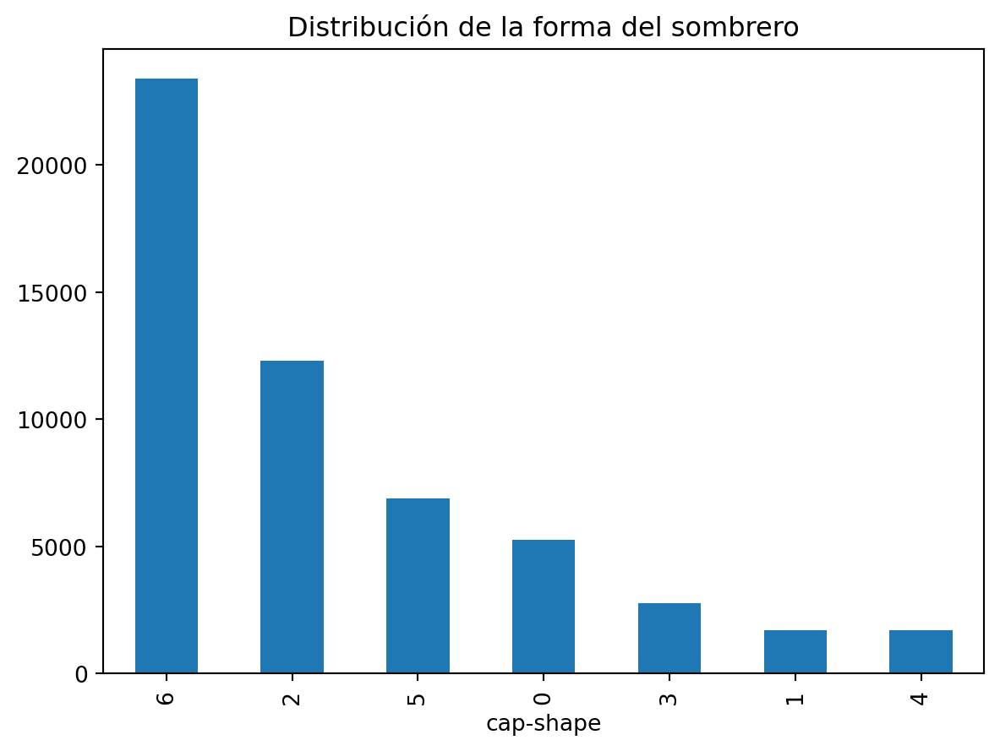

In [3]:
import matplotlib.pyplot as plt

data["cap-shape"].value_counts().plot(kind="bar")
plt.title("Distribución de la forma del sombrero")
plt.show()

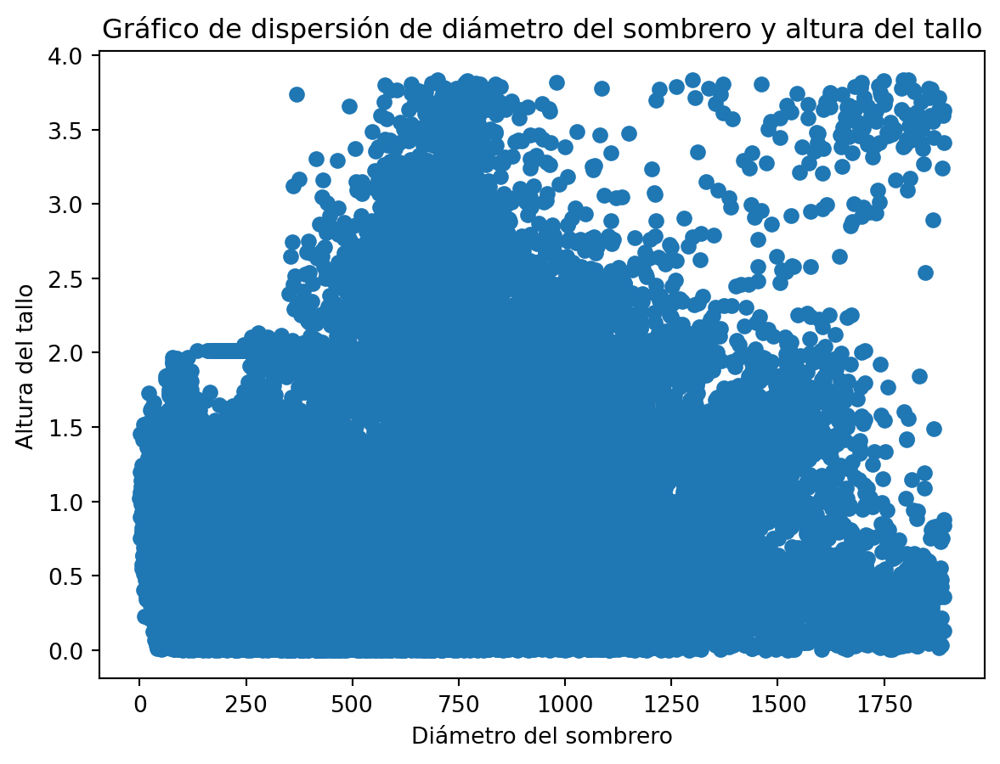

In [4]:
fig, ax = plt.subplots()

ax.scatter(data["cap-diameter"], data["stem-height"])
ax.set_title("Gráfico de dispersión de diámetro del sombrero y altura del tallo")
ax.set_xlabel("Diámetro del sombrero")
ax.set_ylabel("Altura del tallo")

plt.show()

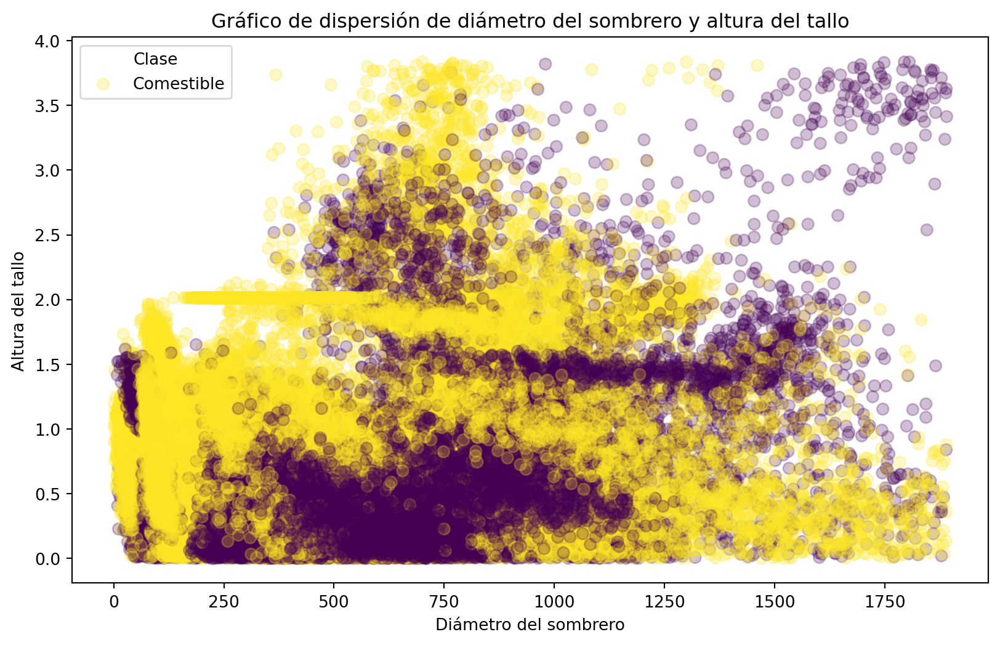

In [5]:
fig, ax = plt.subplots(figsize=(10, 6))

ax.scatter(data["cap-diameter"], data["stem-height"], c=data["class"], s=50, alpha=0.25)
ax.set_title("Gráfico de dispersión de diámetro del sombrero y altura del tallo")
ax.set_xlabel("Diámetro del sombrero")
ax.set_ylabel("Altura del tallo")
ax.legend(labels=["Comestible", "Venenoso"], title="Clase")

plt.show()

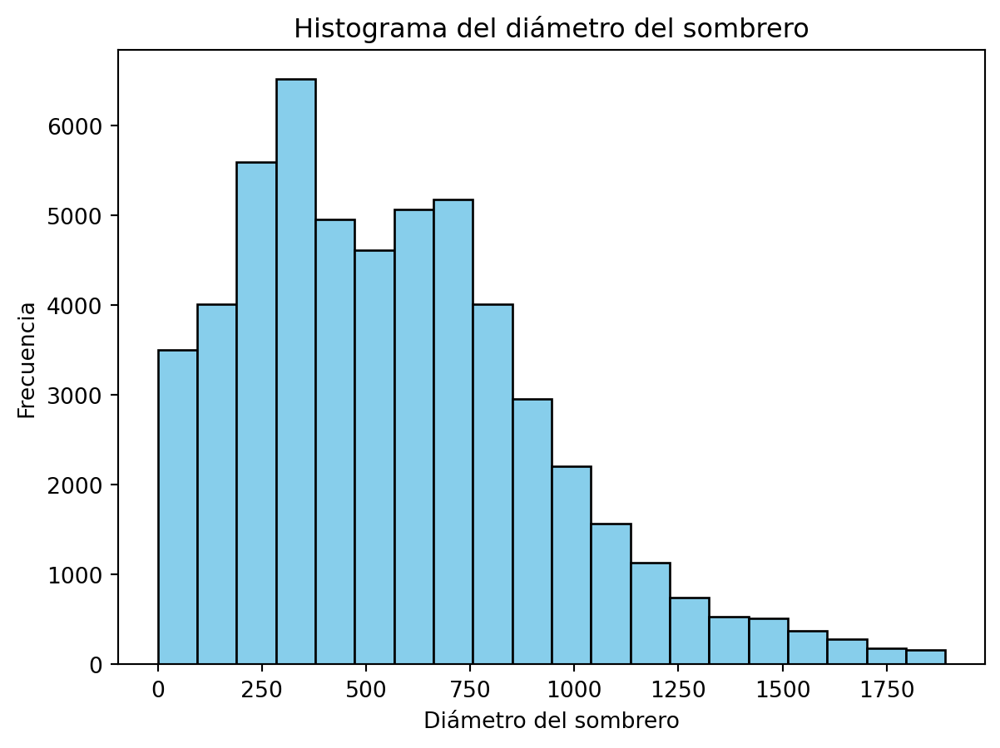

In [6]:
fig, ax = plt.subplots()

ax.hist(data["cap-diameter"], bins=20, color="skyblue", edgecolor="black")
ax.set_title("Histograma del diámetro del sombrero")
ax.set_xlabel("Diámetro del sombrero")
ax.set_ylabel("Frecuencia")

plt.show()

In [7]:
edible = data[data["class"] == 1]

edible = edible[["cap-diameter", "stem-height"]]

edible.head()

,cap-diameter,stem-height
0,1372,3.807467
1,1461,3.807467
2,1371,3.612496
3,1261,3.787572
4,1305,3.711971


<Figure size 960x576 with 0 Axes>

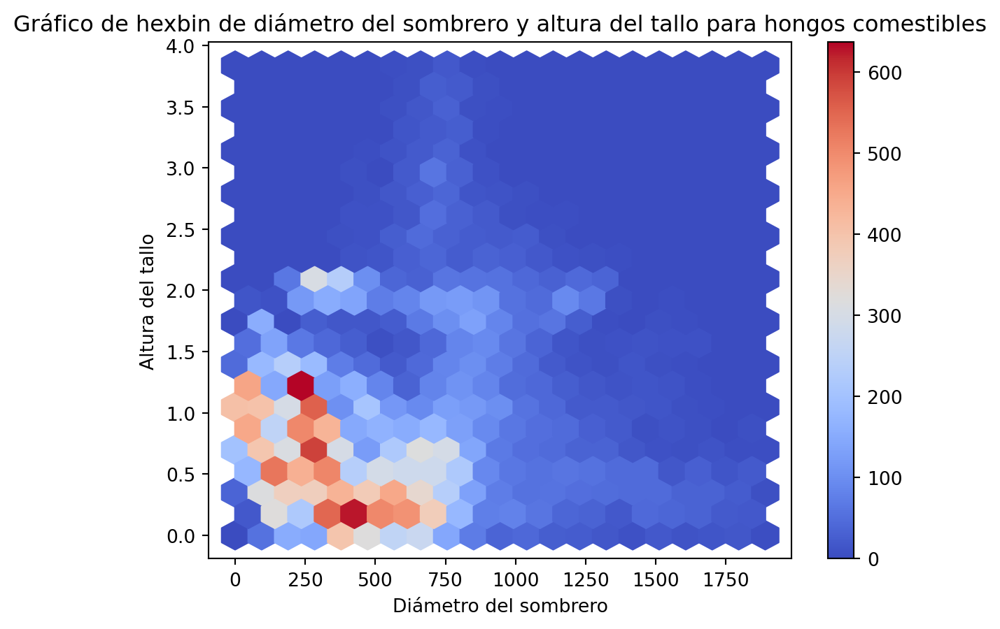

In [8]:
fig = plt.figure(figsize=(10, 6))

ax = edible.plot.hexbin(x="cap-diameter", y="stem-height", gridsize=20, cmap="coolwarm")

ax.set_title("Gráfico de hexbin de diámetro del sombrero y altura del tallo para hongos comestibles")
ax.set_xlabel("Diámetro del sombrero")
ax.set_ylabel("Altura del tallo")

plt.show()

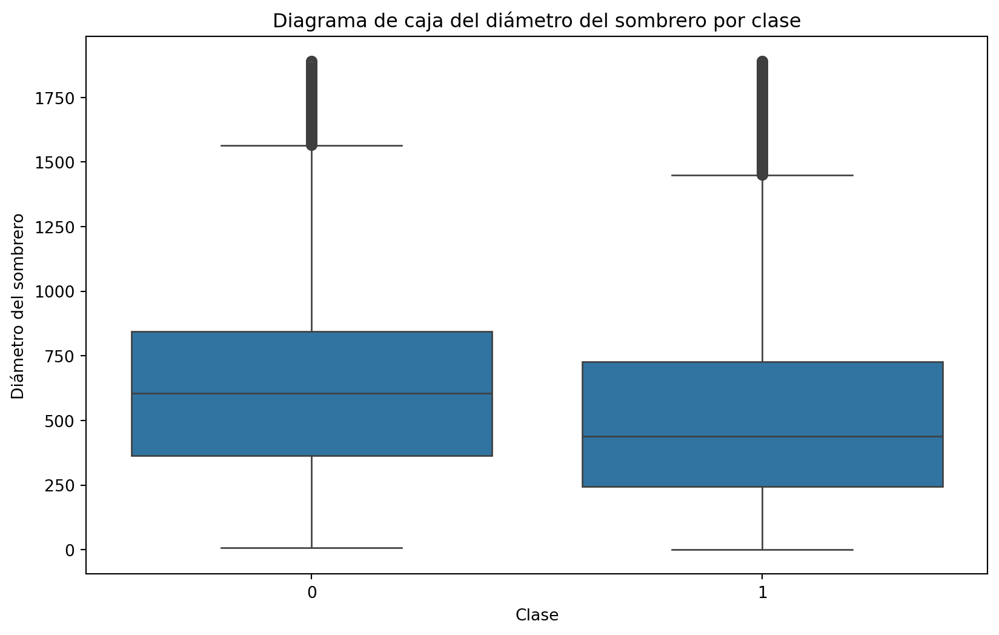

In [9]:
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 6))

sns.boxplot(x="class", y="cap-diameter", data=data, ax=ax)
ax.set_title("Diagrama de caja del diámetro del sombrero por clase")
ax.set_xlabel("Clase")
ax.set_ylabel("Diámetro del sombrero")

plt.show()

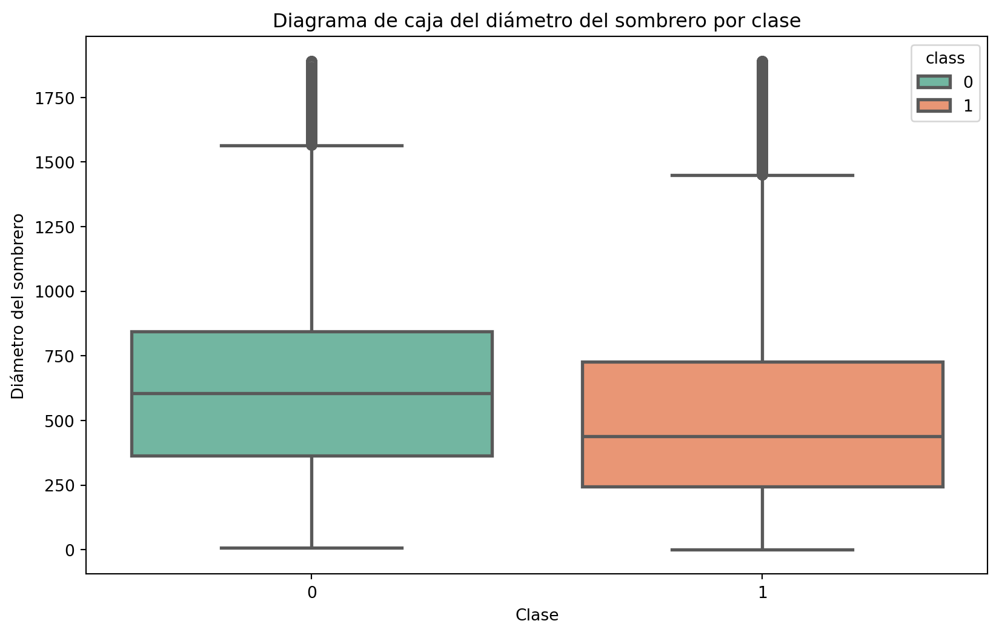

In [10]:
fig, ax = plt.subplots(figsize=(10, 6))

sns.boxplot(hue="class", x="class", y="cap-diameter", data=data, ax=ax, palette="Set2", linewidth=2)

ax.set_title("Diagrama de caja del diámetro del sombrero por clase")
ax.set_xlabel("Clase")
ax.set_ylabel("Diámetro del sombrero")

plt.show()

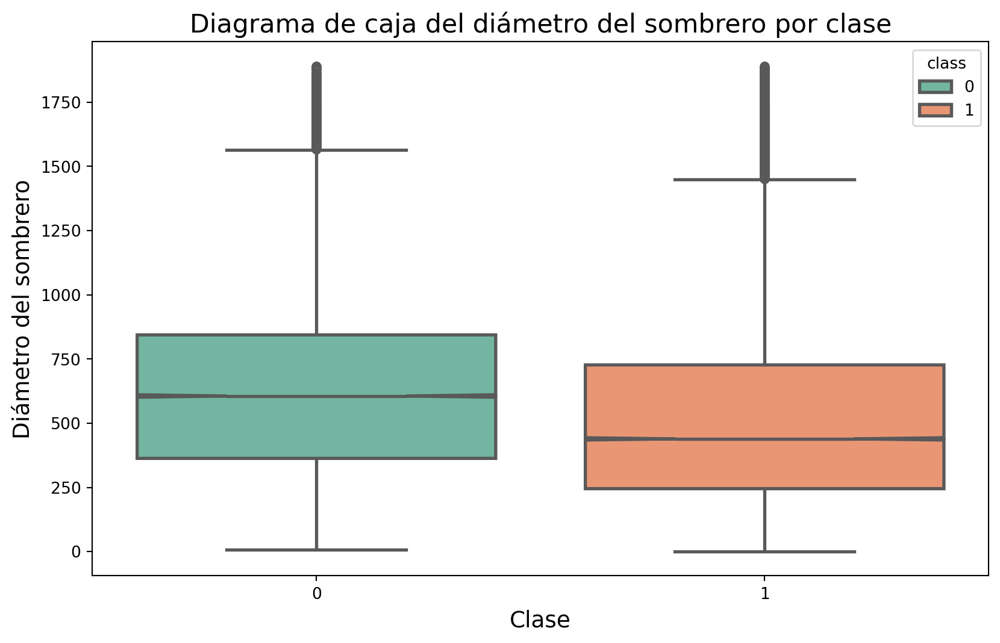

In [11]:
fig, ax = plt.subplots(figsize=(10, 6))

sns.boxplot(hue="class", x="class", y="cap-diameter", data=data, ax=ax, 
            palette="Set2", linewidth=2, fliersize=5, notch=True)

ax.set_title("Diagrama de caja del diámetro del sombrero por clase", fontsize=16)
ax.set_xlabel("Clase", fontsize=14)
ax.set_ylabel("Diámetro del sombrero", fontsize=14)

plt.show()

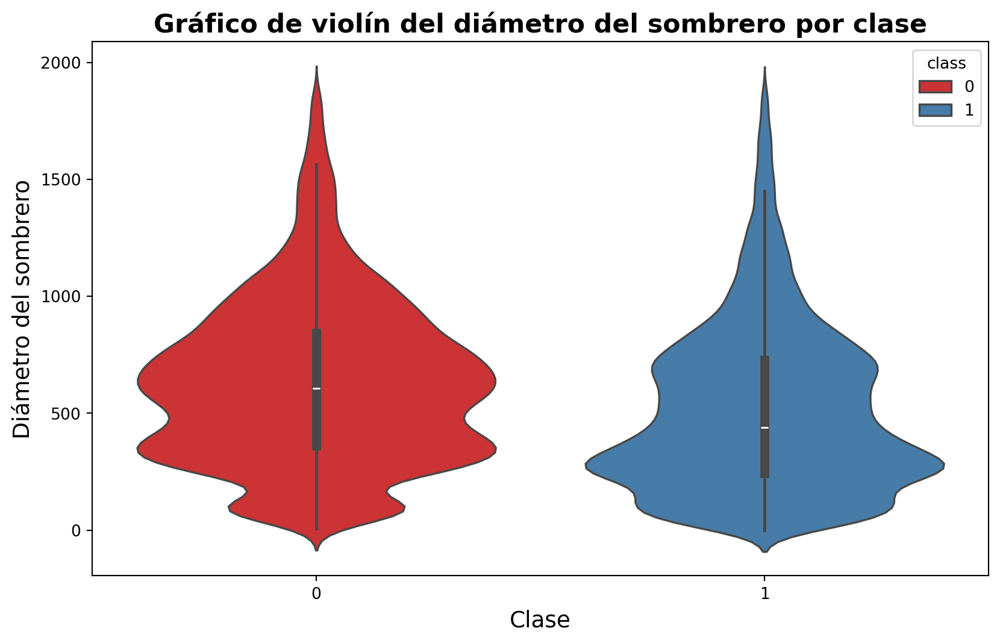

In [12]:
fig, ax = plt.subplots(figsize=(10, 6))

sns.violinplot(x="class", y="cap-diameter", data=data, ax=ax, hue="class", palette="Set1")

ax.set_title("Gráfico de violín del diámetro del sombrero por clase", fontsize=16, fontweight="bold")
ax.set_xlabel("Clase", fontsize=14)
ax.set_ylabel("Diámetro del sombrero", fontsize=14)

plt.show()

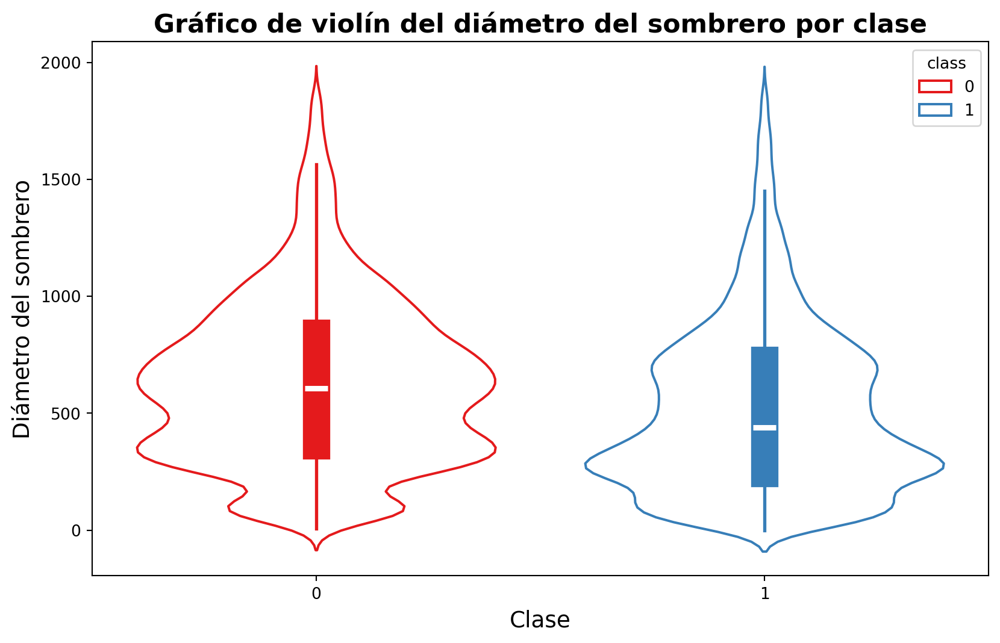

In [13]:
fig, ax = plt.subplots(figsize=(10, 6))

sns.violinplot(x="class", y="cap-diameter", data=data, ax=ax, 
                hue="class", palette="Set1", inner="box", fill=False,
                inner_kws={"linewidth": 1.5, "box_width": 17, "whis_width":2})

ax.set_title("Gráfico de violín del diámetro del sombrero por clase", fontsize=16, fontweight="bold")
ax.set_xlabel("Clase", fontsize=14)
ax.set_ylabel("Diámetro del sombrero", fontsize=14)

plt.show()

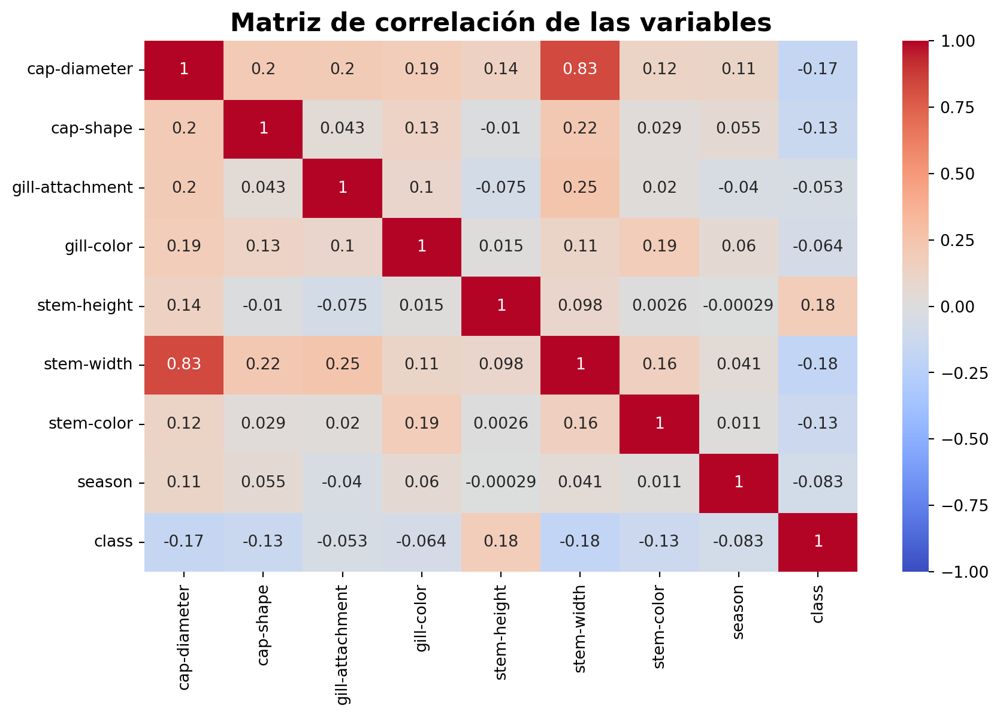

In [14]:
fig, ax = plt.subplots(figsize=(10, 6))

corr = data.corr()

sns.heatmap(corr, annot=True, cmap="coolwarm", ax=ax, vmax=1, vmin=-1)

ax.set_title("Matriz de correlación de las variables", fontsize=16, fontweight="bold")

plt.show()

<Figure size 960x576 with 0 Axes>

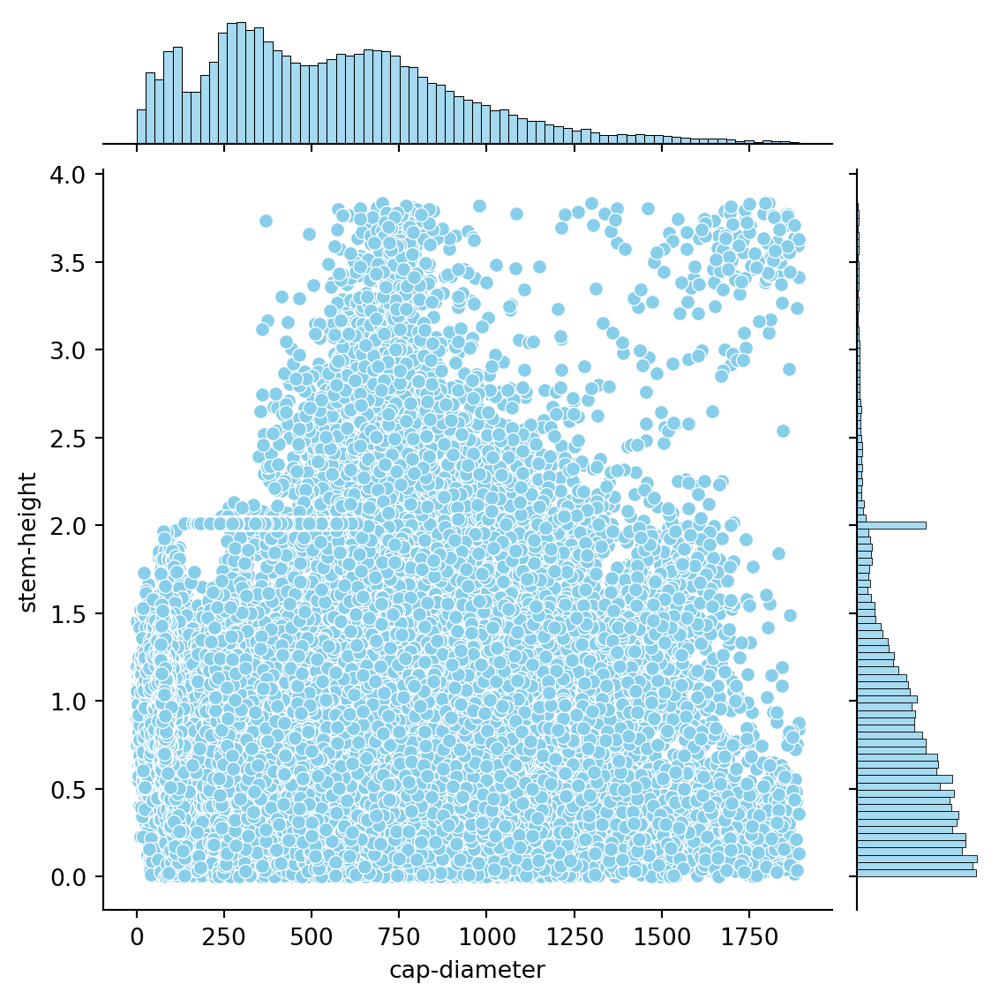

In [15]:
fig = plt.figure(figsize=(10, 6))

sns.jointplot(x="cap-diameter", y="stem-height", data=data, kind="scatter", color="skyblue")

plt.show()

<Figure size 960x576 with 0 Axes>

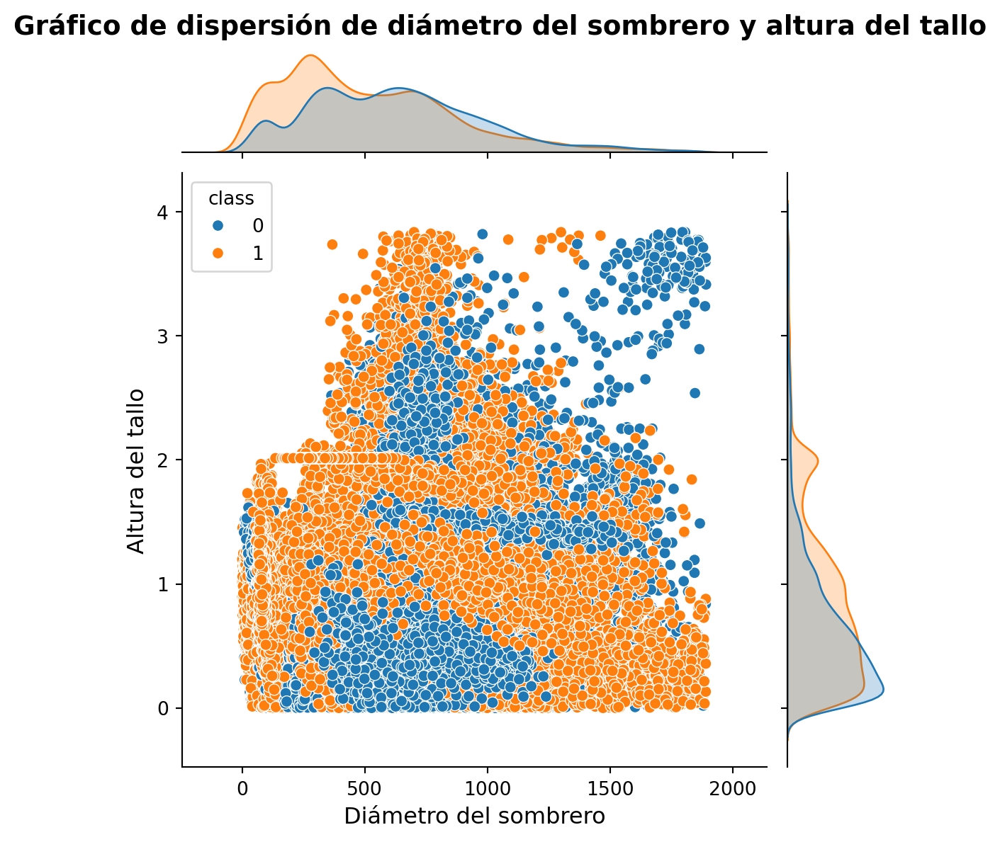

In [16]:
fig = plt.figure(figsize=(10, 6))

ax = sns.jointplot(x="cap-diameter", y="stem-height", data=data, 
                    kind="scatter", color="skyblue", hue="class")

ax.set_axis_labels("Diámetro del sombrero", "Altura del tallo", fontsize=12)
ax.fig.suptitle("Gráfico de dispersión de diámetro del sombrero y altura del tallo", 
                fontsize=14, fontweight="bold", y = 1.02)

plt.show()

<Figure size 960x576 with 0 Axes>

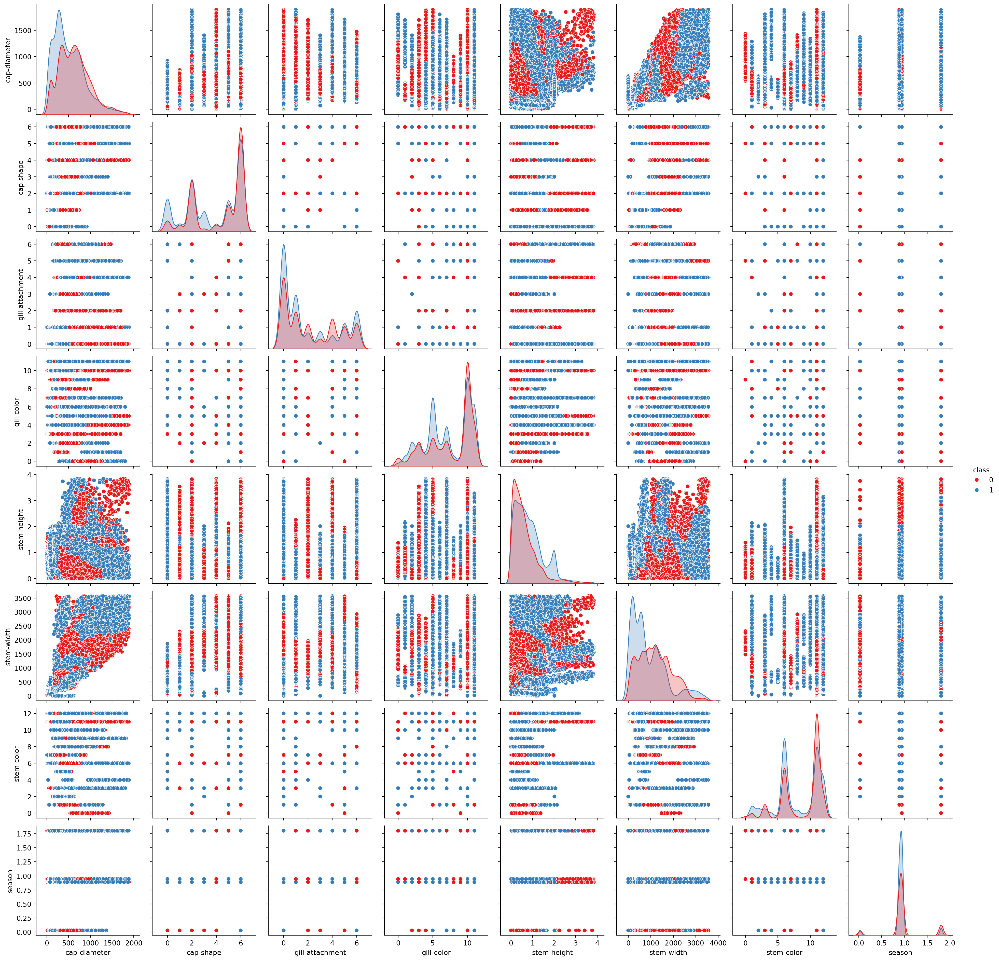

In [17]:
fig = plt.figure(figsize=(10, 6))

sns.pairplot(data, hue="class", palette="Set1")

plt.show()